In [1]:
!git clone https://github.com/Theoceanisfull/AI_Tommie_Mouse.git

Cloning into 'AI_Tommie_Mouse'...
remote: Enumerating objects: 29458, done.
remote: Counting objects: 100% (29458/29458), done.
remote: Compressing objects: 100% (23340/23340), done.
remote: Total 29458 (delta 6784), reused 28786 (delta 6112), pack-reused 0 (from 0)
Receiving objects: 100% (29458/29458), 18.10 MiB | 8.54 MiB/s, done.
Resolving deltas: 100% (6784/6784), done.
Updating files: 100% (24080/24080), done.


In [2]:
%cd AI_Tommie_Mouse

/content/AI_Tommie_Mouse


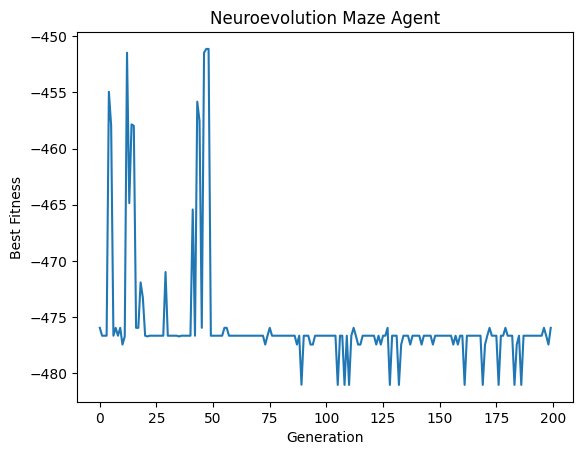

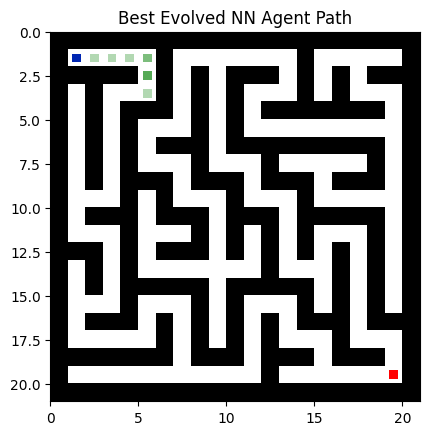

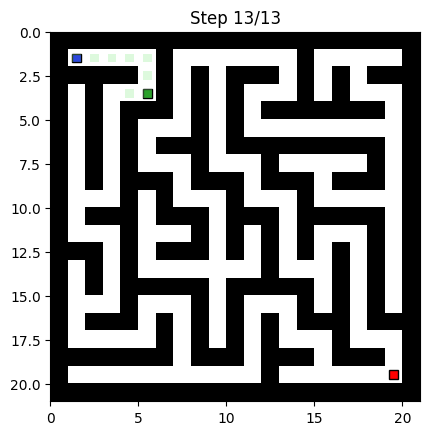

In [28]:
import random
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from enum import unique
from matplotlib.patches import Rectangle
from IPython.display import HTML
from src.maze_generator import MazeGenerator

# --- Maze setup ---
CELL_WALL = 1
CELL_EMPTY = 0
CELL_START = 2
CELL_GOAL = 3

maze = MazeGenerator()
grid = maze.generate_maze(width = 21, height = 21, complexity = "perfect")
rows, cols = grid.shape
start_pos = np.argwhere(grid == CELL_START)[0].tolist()
goal_pos  = np.argwhere(grid == CELL_GOAL)[0].tolist()

# --- Neural Network Agent ---
class NeuralNetAgent:
    def __init__(self, weights = None, input_size = 7, hidden_size = 8, output_size = 4):
        if weights is None:
            self.W1 = np.random.randn(input_size, hidden_size)
            self.W2 = np.random.randn(hidden_size, output_size)
        else:
            self.W1, self.W2 = weights
        self.reward = 0

    def forward(self, x):
        h = np.tanh(np.dot(x, self.W1))
        out = np.dot(h, self.W2)
        return np.argmax(out)  # Best move

    def simulate(self, start_pos, grid, goal_pos, max_steps = (rows * cols // 2), stuck_lim = 20):
        y, x = start_pos
        path = [(y, x)]
        visited = set()
        visited.add((y, x))
        recent_moves = []
        self.reward = 0
        no_prog = 0
        gy, gx = goal_pos
        for _ in range(max_steps):
            # Inputs: Relative position to goal & local walls
            visited_flag = 1 if (y, x) in visited else 0
            inputs = np.array([
                (gy - y)/rows, (gx - x) / cols,         # Normalized goal direction
                grid[y - 1, x] if y > 0 else 1,         # Wall above
                grid[y, x - 1] if x > 0 else 1,         # Wall left
                grid[y + 1, x] if y < rows - 1 else 1,  # Wall below
                grid[y, x + 1] if x < cols - 1 else 1,  # Wall right
                visited_flag                            # Visited cells
            ])
            move = self.forward(inputs)
            if random.random() < 0.05:
                move = random.randint(0, 3)
            ny, nx = y, x
            if move == 0: ny -= 1    # Up
            elif move == 1: ny += 1  # Down
            elif move == 2: nx -= 1  # Left
            elif move == 3: nx += 1  # Right

            # Step Cost
            self.reward -= 0.05

            if not (0 <= ny < rows and 0 <= nx < cols) or grid[ny, nx] == CELL_WALL:
                self.reward -= 2
                continue

            prev_dist = np.linalg.norm([y - gy, x - gx])
            y, x = ny, nx
            path.append((y, x))

            # Revisit Penalty
            if (y, x) in visited:
                self.reward -= 3
            visited.add((y, x))

            # Oscillation Penalty
            recent_moves.append((y, x))
            if len(recent_moves) > 5:
                recent_moves.pop(0)
            if (y, x) in recent_moves[:-1]:
                self.reward -= 2

            # Progress Bonus
            new_dist = np.linalg.norm([y - gy, x - gx])
            prog = prev_dist - new_dist
            if prog > 0:
                self.reward += prog * 1
                no_prog = 0
            else:
              self.reward -= 0.05
              no_prog += 1

            # Stuck Detection & Penalty
            if no_prog > stuck_lim:
              self.reward -= 10
              break

            # Goal
            if (y, x) == tuple(goal_pos):
              self.reward += 100 + (max_steps - len(path)) * 0.5
              break

        # Reward Closeness to Goal
        fin_dist = np.linalg.norm([y - gy, x - gx])
        if (y, x) != tuple(goal_pos):
          if fin_dist < 2:
            self.reward += 30
          elif fin_dist < 5:
            self.reward += 15
          elif fin_dist < 10:
            self.reward += 5

        return path

    def get_weights(self):
        return [self.W1.copy(), self.W2.copy()]

# --- Fitness Function ---
def fitness(agent):
    path = agent.simulate(start_pos, grid, goal_pos)
    end_y, end_x = path[-1]
    gy, gx = goal_pos
    dist = np.linalg.norm([end_y - gy, end_x - gx])
    unique_cells = len(set(path))
    revisit_penalty = len(path) - unique_cells

    score = 0
    score -= dist * 2
    score -= len(path) * 0.005
    score -= revisit_penalty * 0.5
    score += unique_cells * 0.1
    score += agent.reward or 0

    if (end_y, end_x) == tuple(goal_pos):
        score += 150 + (max_steps - len(path)) * 0.5
    else:
      if dist < 2:
        score += 30
      elif dist < 5:
        score += 15
      elif dist < 10:
        score += 5

    return score

# --- Define Evolution ---
def crossover(p1, p2):
    w1a, w2a = p1.get_weights()
    w1b, w2b = p2.get_weights()
    cut = random.randint(0, w1a.size - 1)
    flat1, flat2 = w1a.flatten(), w1b.flatten()
    child_w1 = np.concatenate([flat1[:cut], flat2[cut:]]).reshape(w1a.shape)
    child_w2 = (w2a + w2b)/2.0
    return NeuralNetAgent([child_w1, child_w2])

def mutate(agent, rate = 0.1):
    w1, w2 = agent.get_weights()
    for mat in [w1, w2]:
        mask = np.random.rand(*mat.shape) < rate
        mat[mask] += np.random.randn(*mat[mask].shape) * 0.5
    return NeuralNetAgent([w1, w2])

# --- Run Generations ---
pop_size = 100
gens = 200
population = [NeuralNetAgent() for _ in range(pop_size)]
best_scores = []

for g in range(gens):
    # Evaluate
    scores = [fitness(ind) for ind in population]
    ranked = [x for _, x in sorted(zip(scores, population), key = lambda p:p[0], reverse = True)]
    best_scores.append(max(scores))

    # Reproduce
    new_pop = ranked[:20]
    while len(new_pop) < pop_size:
        p1, p2 = random.sample(ranked[:20], 2)
        child = crossover(p1, p2)
        child = mutate(child)
        new_pop.append(child)
    population = new_pop

# --- Plot Fitness ---
plt.plot(best_scores)
plt.xlabel("Generation")
plt.ylabel("Best Fitness")
plt.title("Neuroevolution Maze Agent")
plt.show()

# --- Visualize Best Agent Path ---
best_agent = ranked[0]
best_path = best_agent.simulate(start_pos, grid, goal_pos)

fig, ax = plt.subplots()
ax.imshow((grid == CELL_WALL).astype(int), cmap = 'gray_r', origin = 'upper',
          extent = [0, cols, rows, 0], vmin = 0, vmax = 1)

sy, sx = start_pos
gy, gx = goal_pos
ax.add_patch(Rectangle((sx + 0.25, sy + 0.25), 0.5, 0.5, facecolor = 'blue'))
ax.add_patch(Rectangle((gx + 0.25, gy + 0.25), 0.5, 0.5, facecolor = 'red'))

for (y,x) in best_path:
    ax.add_patch(Rectangle((x + 0.25, y + 0.25), 0.5, 0.5, facecolor = 'green', alpha = 0.3))

ax.set_title("Best Evolved NN Agent Path")
plt.show()

# --- Maze Visualization ---
best_agent = ranked[0]
best_path = best_agent.simulate(start_pos, grid, goal_pos)

fig, ax = plt.subplots()
visited = set()
agent_index = 0

def update(frame):
    global agent_index
    ax.clear()
    ax.set_aspect('equal')
    ax.set_xlim(0, cols)
    ax.set_ylim(rows, 0)

    # Draw maze walls
    ax.imshow((grid == CELL_WALL).astype(int), cmap = 'gray_r', origin = 'upper',
              extent = [0, cols, rows, 0], vmin = 0, vmax = 1)

    # Draw start and goal
    sy, sx = start_pos
    gy, gx = goal_pos
    ax.add_patch(Rectangle((sx + 0.25, sy + 0.25), 0.5, 0.5,
                           facecolor = 'blue', edgecolor = 'black'))
    ax.add_patch(Rectangle((gx + 0.25, gy + 0.25), 0.5, 0.5,
                           facecolor = 'red', edgecolor = 'black'))

    # Move agent along path
    agent_pos = best_path[agent_index]
    visited.add(tuple(agent_pos))
    ax.add_patch(Rectangle((agent_pos[1] + 0.25, agent_pos[0] + 0.25), 0.5, 0.5,
                           facecolor = 'green', edgecolor = 'black'))

    # Overlay visited cells
    for vy, vx in visited:
        ax.add_patch(Rectangle((vx + 0.25, vy + 0.25), 0.5, 0.5,
                               facecolor = 'lightgreen', alpha = 0.3))

    # Step counter
    ax.set_title(f"Step {agent_index+1}/{len(best_path)}")

    # Advance agent index
    if agent_index < len(best_path) - 1:
        agent_index += 1

anim = animation.FuncAnimation(fig, update, frames = len(best_path), interval = 400)
HTML(anim.to_jshtml())

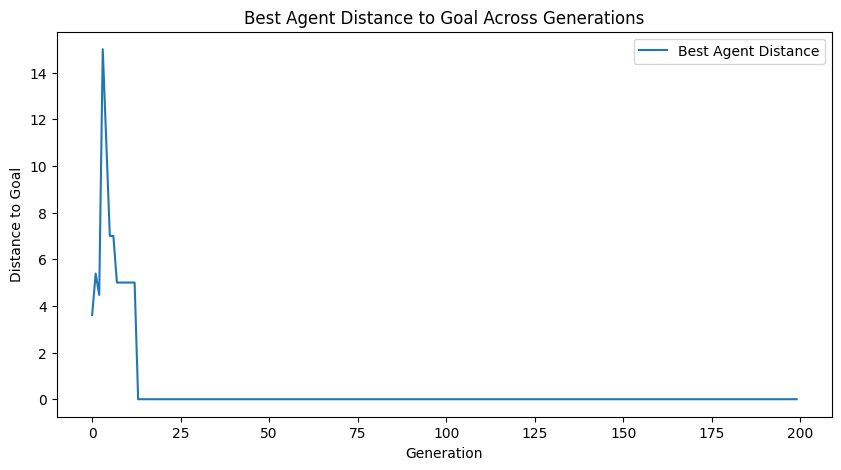

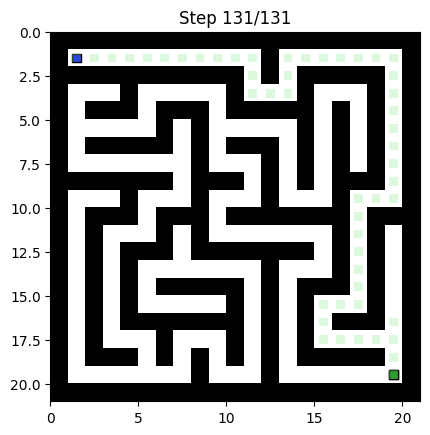

In [ ]:
# --- Imports ---
import random
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from enum import unique
from matplotlib.patches import Rectangle
from IPython.display import HTML
from src.maze_generator import MazeGenerator

# --- Setup Maze ---
CELL_WALL = 1
CELL_EMPTY = 0
CELL_START = 2
CELL_GOAL = 3

maze = MazeGenerator()
grid = maze.generate_maze(width = 21, height = 21, complexity = "perfect")

rows, cols = grid.shape
start_pos = np.argwhere(grid == CELL_START)[0].tolist()
goal_pos  = np.argwhere(grid == CELL_GOAL)[0].tolist()

# --- Define Movement ---
moves = ["U", "D", "L", "R"]

class Agent:
    def __init__(self, genome = None, length = 800):
        if genome is None:
            self.genome = [random.choice(moves) for _ in range(length)]
        else:
            self.genome = genome
        self.reward = None

    def simulate(self, start_pos, grid, goal_pos = None):
        y, x = start_pos
        path = [(y, x)]
        rows, cols = grid.shape

        for move in self.genome:
            ny, nx = y, x
            if move == "U": ny -= 1
            elif move == "D": ny += 1
            elif move == "L": nx -= 1
            elif move == "R": nx += 1

            # Stay in bounds & avoid walls
            if 0 <= ny < rows and 0 <= nx < cols and grid[ny, nx] != CELL_WALL:
                y, x = ny, nx
                path.append((y, x))

                #Stop if goal is reached
                if goal_pos is not None and (y, x) == tuple(goal_pos):
                    break
        return path

# --- Define Reward ---
def reward(path, goal_pos, genome_length = 800):
  end_y, end_x = path[-1]
  goal_y, goal_x = goal_pos
  distance = np.linalg.norm([end_y - goal_y, end_x - goal_x])
  unique_cells = len(set(path))

  #Penalties
  revisit_penalty = len(path) - unique_cells
  step_penalty = 0.001 * len(path)
  cyc_penalty = 0
  max_cyc_len = 4
  for cyc_len in range(2, max_cyc_len + 1):
    for i in range(cyc_len, len(path)):
      if path[i] == path[i - cyc_len]:
        cyc_penalty += 0.5 * (1.0 / cyc_len)

  #Bonuses
  exp_bonus = 0.2 * unique_cells * (distance / (rows + cols))
  progress_bonus = 0
  for i in range(1, len(path)):
    prev_dist = np.linalg.norm(np.array(path[i-1]) - np.array(goal_pos))
    curr_dist = np.linalg.norm(np.array(path[i]) - np.array(goal_pos))
    if curr_dist < prev_dist:
      progress_bonus += (prev_dist - curr_dist)
  if path[-1] == tuple(goal_pos):
    time_bonus = 10.0 * (1- len(path) / genome_length)
    return 500.0 - revisit_penalty - step_penalty + exp_bonus + progress_bonus + time_bonus
  return progress_bonus - revisit_penalty - step_penalty + exp_bonus

# --- Define Evolution ---
def crossover(parent1, parent2):
    cut = random.randint(0, len(parent1.genome) - 1)
    child_genome = parent1.genome[:cut] + parent2.genome[cut:]
    return Agent(child_genome)

def mutate(individual, mutation_rate = 0.1):
    for i in range(len(individual.genome)):
        if random.random() < mutation_rate:
            individual.genome[i] = random.choice(moves)

# --- Run Generations ---
pop_size = 100
gens = 200
pop = [Agent() for _ in range(pop_size)]
best_distance = []

for gen in range(gens):
    # Evaluate
    for indiv in pop:
        path = indiv.simulate(start_pos, grid)
        indiv.reward = reward(path, goal_pos)

    # Select
    pop.sort(key = lambda a: a.reward, reverse = True)
    best = pop[0]
    best_path = best.simulate(start_pos, grid)
    best_dist = np.linalg.norm(np.array(best_path[-1]) - np.array(goal_pos))
    best_distance.append(best_dist)

    # Reproduce
    survivors = pop[:20]
    new_pop = survivors.copy()
    while len(new_pop) < pop_size:
        parent1 = random.choice(survivors)
        parent2 = random.choice(survivors)
        child = crossover(parent1, parent2)
        mutate(child)
        new_pop.append(child)
    pop = new_pop

# --- Distance vs. Generation Visual ---
plt.figure(figsize=(10,5))
plt.plot(best_distance, label = "Best Agent Distance")
plt.xlabel("Generation")
plt.ylabel("Distance to Goal")
plt.title("Best Agent Distance to Goal Across Generations")
plt.legend()
plt.show()

# --- Maze Visualization ---
agent_index = 0
visited = set()
best_path = best.simulate(start_pos, grid, goal_pos)

fig, ax = plt.subplots()

def update(frame):
    global agent_index
    ax.clear()
    ax.set_aspect('equal')
    ax.set_xlim(0, cols)
    ax.set_ylim(rows, 0)

    # Draw maze walls
    ax.imshow((grid == CELL_WALL).astype(int), cmap = 'gray_r', origin = 'upper',
              extent = [0, cols, rows, 0], vmin = 0, vmax = 1)

    # Draw start and goal (positions are [row, col] -> (x = col, y = row))
    sy, sx = start_pos  # sy = row, sx = col
    gy, gx = goal_pos   # gy = row, gx = col
    ax.add_patch(Rectangle((sx + 0.25, sy + 0.25), 0.5, 0.5,
                           facecolor = 'blue', edgecolor = 'black'))
    ax.add_patch(Rectangle((gx + 0.25, gy + 0.25), 0.5, 0.5,
                           facecolor = 'red', edgecolor = 'black'))

    # Move agent along best path
    agent_pos = best_path[agent_index]
    visited.add(tuple(agent_pos))
    ax.add_patch(Rectangle((agent_pos[1] + 0.25, agent_pos[0] + 0.25), 0.5, 0.5,
                           facecolor = 'green', edgecolor = 'black'))

    # Overlay visited cells
    for vy, vx in visited:
        ax.add_patch(Rectangle((vx + 0.25, vy + 0.25), 0.5, 0.5,
                               facecolor = 'lightgreen', alpha = 0.3))

    # Step counter
    ax.set_title(f"Step {agent_index + 1}/{len(best_path)}")

    # Advance agent index
    if agent_index < len(best_path) - 1:
        agent_index += 1

anim = animation.FuncAnimation(fig, update, frames = len(best_path), interval = 400)
HTML(anim.to_jshtml())

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


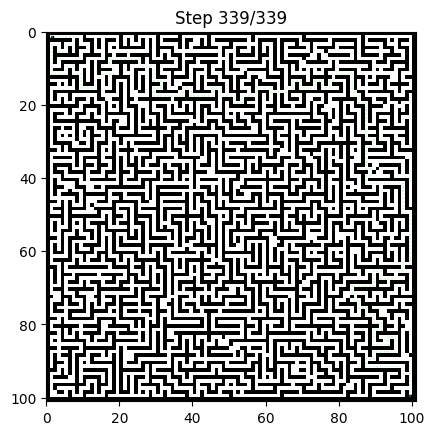

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML
from matplotlib.patches import Rectangle
from src.maze_generator import MazeGenerator

CELL_WALL = 1
CELL_EMPTY = 0
CELL_START = 2
CELL_GOAL = 3

# --- Setup Maze ---
maze = MazeGenerator()
grid = maze.generate_maze(width=101, height=101, complexity = "imperfect")

rows, cols = grid.shape
start_pos = np.argwhere(grid == CELL_START)[0].tolist()
goal_pos = np.argwhere(grid == CELL_GOAL)[0].tolist()

# Solve with A*
path, steps = maze.solve_astar(grid)
agent_index = 0
visited = set()

# --- Ray casting helpers ---
def grid_to_walls(grid):
    walls = []
    rows, cols = grid.shape
    for y in range(rows):
        for x in range(cols):
            if grid[y][x] == CELL_WALL:
                walls.append(((x, y), (x+1, y)))     # top
                walls.append(((x+1, y), (x+1, y+1))) # right
                walls.append(((x+1, y+1), (x, y+1))) # bottom
                walls.append(((x, y+1), (x, y)))     # left
    return walls

def ray_intersection(x1, y1, x2, y2, x3, y3, x4, y4):
    denom = ((y4 - y3) * (x2 - x1) - (x4 - x3) * (y2 - y1))
    if denom == 0:
        return None
    ua = ((x4 - x3) * (y1 - y3) - (y4 - y3) * (x1 - x3)) / denom
    ub = ((x2 - x1) * (y1 - y3) - (y2 - y1) * (x1 - x3)) / denom
    if ua < 0 or ua > 1 or ub < 0 or ub > 1:
        return None
    x = x1 + ua * (x2 - x1)
    y = y1 + ua * (y2 - y1)
    return (x, y)

def cast_rays(agent_pos, walls, rows, cols):
    x, y = agent_pos
    dirs = [(1,0), (0,1), (-1,0), (0,-1)]  # right, down, left, up
    max_len = rows + cols
    rays = []
    for dx, dy in dirs:
        ex = np.clip(x + dx * max_len, 0, cols)
        ey = np.clip(y + dy * max_len, 0, rows)
        start = (x, y)
        end = (ex, ey)

        closest = None
        min_dist = float('inf')
        for (x3, y3), (x4, y4) in walls:
            hit = ray_intersection(*start, *end, x3, y3, x4, y4)
            if hit is not None:
                dist = np.hypot(hit[0] - x, hit[1] - y)
                if dist < min_dist:
                    min_dist = dist
                    closest = hit
        rays.append((start, closest))
    return rays

walls = grid_to_walls(grid)

# --- Animation ---
fig, ax = plt.subplots()

def update(frame):
    global agent_index
    ax.clear()
    ax.set_aspect('equal')
    ax.set_xlim(0, cols)
    ax.set_ylim(rows, 0)

    # Draw maze walls
    ax.imshow((grid == CELL_WALL).astype(int), cmap='gray_r', origin='upper',
              extent=[0, cols, rows, 0], vmin=0, vmax=1)

    # Draw start and goal
    sx, sy = start_pos
    gx, gy = goal_pos
    ax.add_patch(Rectangle((sx + 0.25, sy + 0.25), 0.5, 0.5,
                           facecolor='blue', edgecolor='black'))
    ax.add_patch(Rectangle((gx + 0.25, gy + 0.25), 0.5, 0.5,
                           facecolor='red', edgecolor='black'))

    # Move agent along A* path
    agent_pos = path[agent_index]
    visited.add(tuple(agent_pos))
    ax.add_patch(Rectangle((agent_pos[1] + 0.25, agent_pos[0] + 0.25), 0.5, 0.5,
                           facecolor='green', edgecolor='black'))

    # Overlay visited cells
    for vy, vx in visited:
        ax.add_patch(Rectangle((vx + 0.25, vy + 0.25), 0.5, 0.5,
                               facecolor='lightgreen', alpha=0.3))

    # Rays
    rays = cast_rays((agent_pos[1], agent_pos[0]), walls, rows, cols)
    for start, hit in rays:
        if hit:
            ax.plot([start[0], hit[0]], [start[1], hit[1]], 'b--')
            ax.add_patch(Rectangle((hit[0]-0.1, hit[1]-0.1), 0.2, 0.2,
                                   facecolor='blue'))

    # Step counter
    ax.set_title(f"Step {agent_index+1}/{len(path)}")

    # Advance agent index
    if agent_index < len(path) - 1:
        agent_index += 1

anim = animation.FuncAnimation(fig, update, frames=len(path), interval=400)
HTML(anim.to_jshtml())